In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [2]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [3]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [4]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [5]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [6]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [7]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [8]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [9]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [10]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [11]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [85]:
class_markers = [
    'AXL',     # ASDCs
    'CCL3',    # IL1B+ Monocytes
    'CD14',    # CD14+ Monocytes and cDC2s
    'CD1C',    # cDC2
    'FCER1A',  # cDC2
    'FCGR3A',  # CD16+ Monocytes
    'HLA-DRA', # CD16+ Monocytes; DCs
    'IFI44L',  # ISG+ cells
    'IRF4',    # pDC
    'IRF8',    # pDC
    'NFKBIA'   # IL1B+ Monocytes
]

## Read cell type hierarchy

In [13]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [14]:
search_id = 'europium-phosphorus-plutonium'

Retrieve files stored in our HISE project store

In [15]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [16]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [17]:
search_df['AIFI_L3'].tolist()

['ASDC',
 'C1Q+ CD16 monocyte',
 'CD14+ cDC2',
 'Core CD14 monocyte',
 'Core CD16 monocyte',
 'HLA-DRhi cDC2',
 'IL1B+ CD14 monocyte',
 'ISG+ CD14 monocyte',
 'ISG+ CD16 monocyte',
 'ISG+ cDC2',
 'Intermediate monocyte',
 'cDC1',
 'pDC']

## DCs

### Review ASDC

In [18]:
cell_type = 'ASDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [19]:
type_uuid

'8ce25d9b-42a2-4323-9eb7-1a8b9f0a0d9c'

In [20]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 8ce25d9b-42a2-4323-9eb7-1a8b9f0a0d9c
Files have been successfully downloaded!


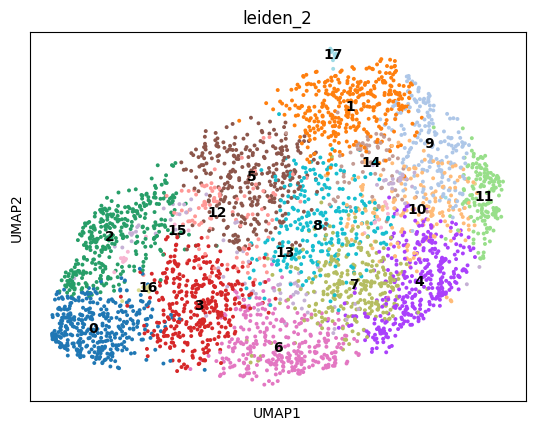

In [21]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

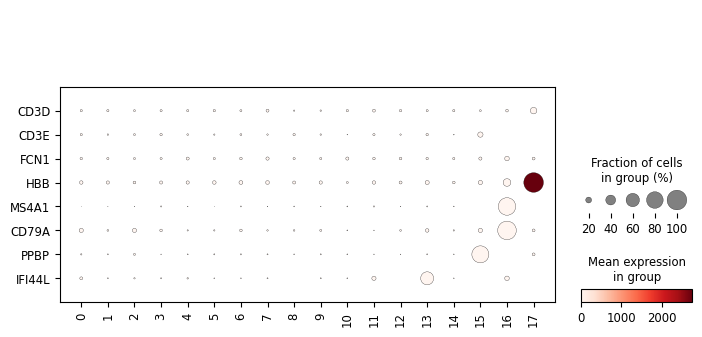

In [22]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

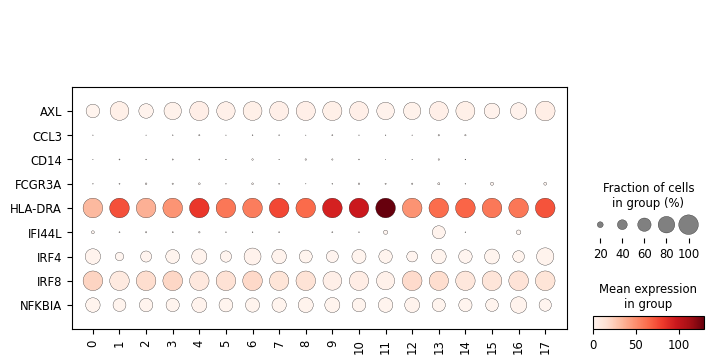

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

In [28]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     380
1     348
2     348
3     346
4     342
5     315
6     304
7     288
8     251
9     185
10    173
11    164
12     99
13     97
14     71
15     23
16     14
17     13
Name: count, dtype: int64

### Review cDC1

In [30]:
cell_type = 'cDC1'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [31]:
type_uuid

'1dc6c431-11f3-40b8-b112-b22cd40a6598'

In [32]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 1dc6c431-11f3-40b8-b112-b22cd40a6598
Files have been successfully downloaded!


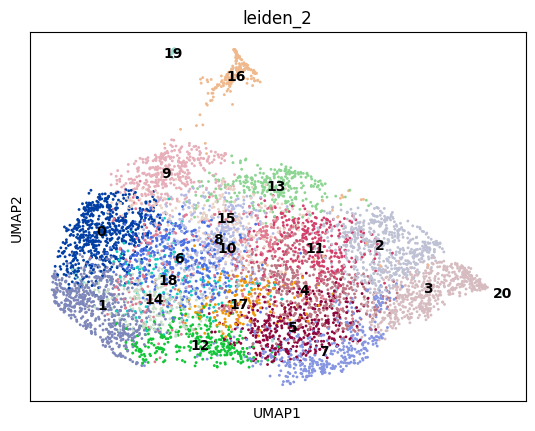

In [33]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

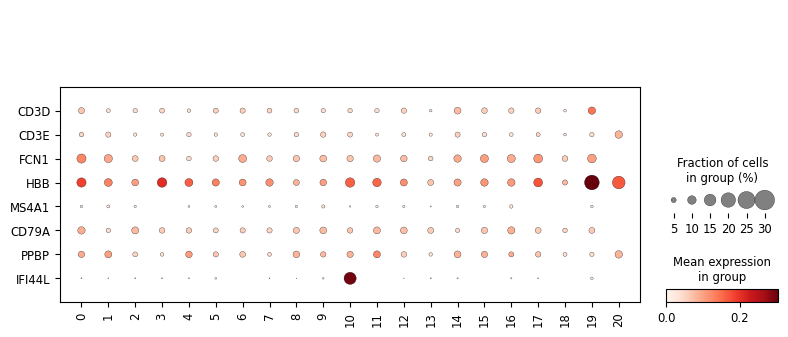

In [34]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

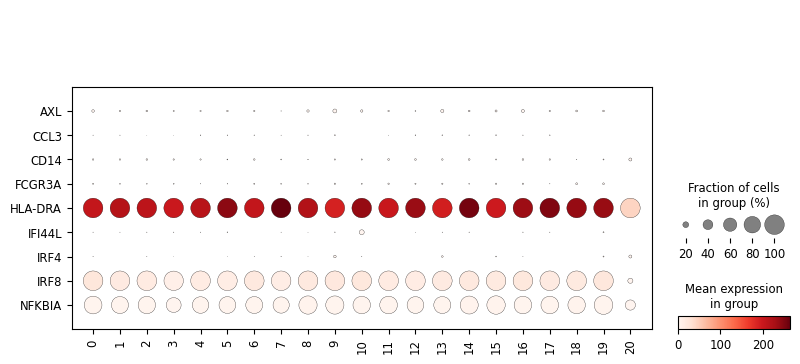

In [35]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

In [36]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     647
1     618
2     601
3     531
4     454
5     408
6     404
7     403
8     375
9     369
10    329
11    317
12    301
13    292
14    256
15    241
16    239
17    164
18    137
19     49
20     12
Name: count, dtype: int64

### Review CD14+ cDC2

In [37]:
cell_type = 'CD14+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [38]:
type_uuid

'1b28b3bf-d911-4e3d-9e05-6627ce919941'

In [39]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 1b28b3bf-d911-4e3d-9e05-6627ce919941
Files have been successfully downloaded!


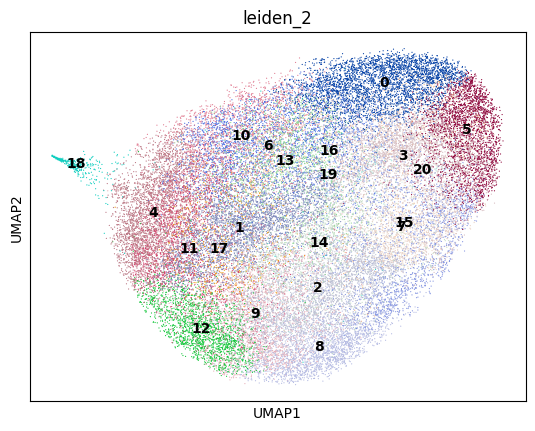

In [40]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

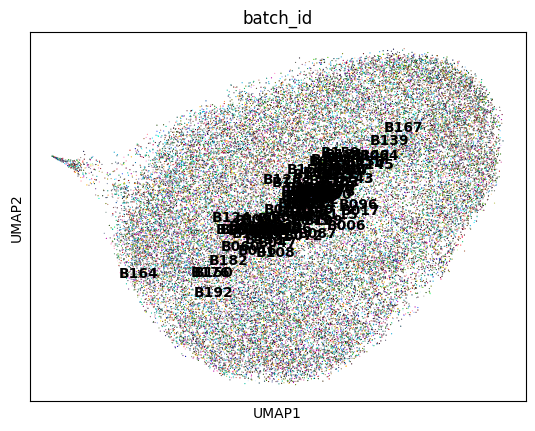

In [41]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

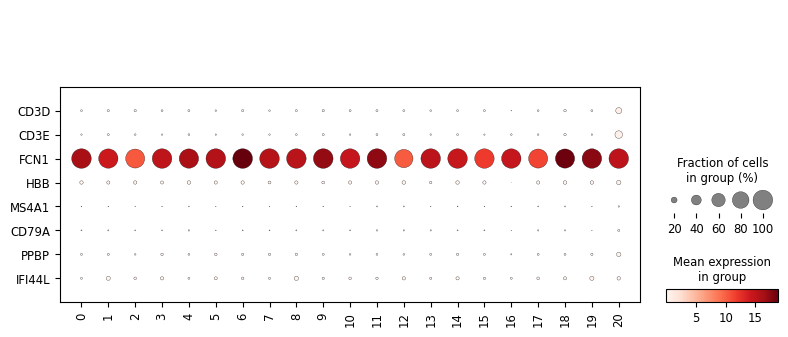

In [42]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

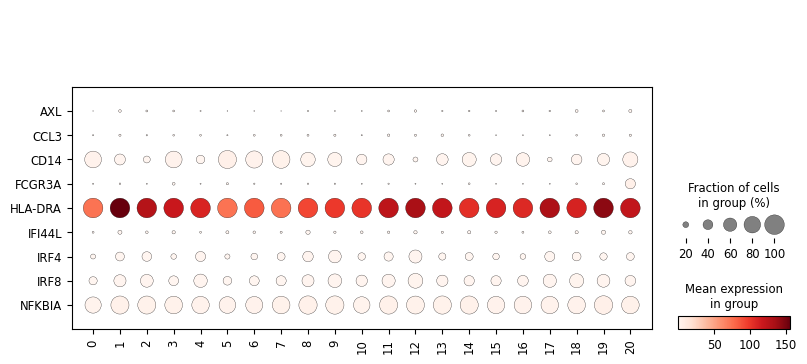

In [43]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

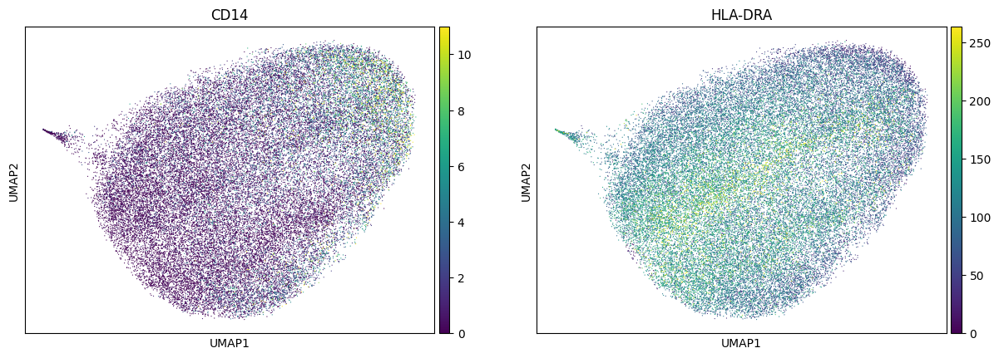

In [44]:
sc.pl.umap(adata, color = ['CD14','HLA-DRA'], vmax = 'p99', ncols = 2)

In [45]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     3500
1     3301
2     3073
3     3018
4     2966
5     2679
6     2667
7     2277
8     2277
9     2250
10    1924
11    1918
12    1830
13    1610
14    1557
15    1554
16     892
17     586
18     389
19     336
20     139
Name: count, dtype: int64

### Review HLA-DRhi cDC2

In [46]:
cell_type = 'HLA-DRhi cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [47]:
type_uuid

'b98e59e7-73ea-4a81-a852-7b6d201c2b86'

In [48]:
adata = read_adata_uuid(type_uuid)

downloading fileID: b98e59e7-73ea-4a81-a852-7b6d201c2b86
Files have been successfully downloaded!


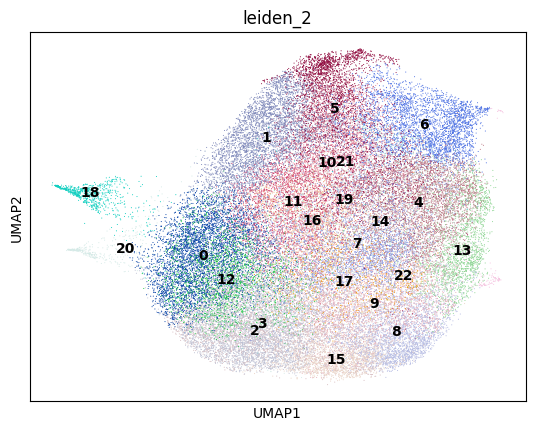

In [49]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

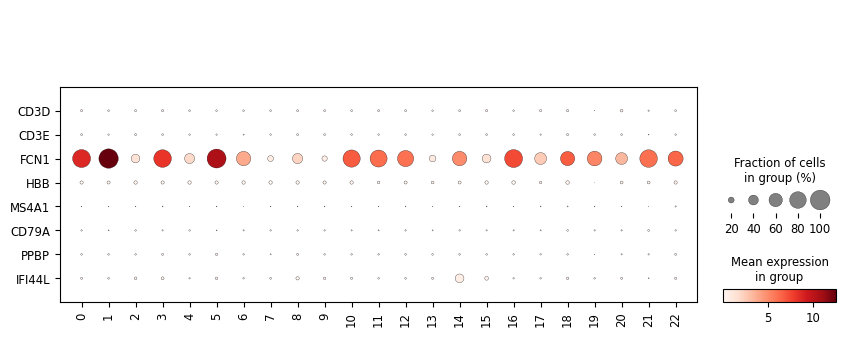

In [50]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

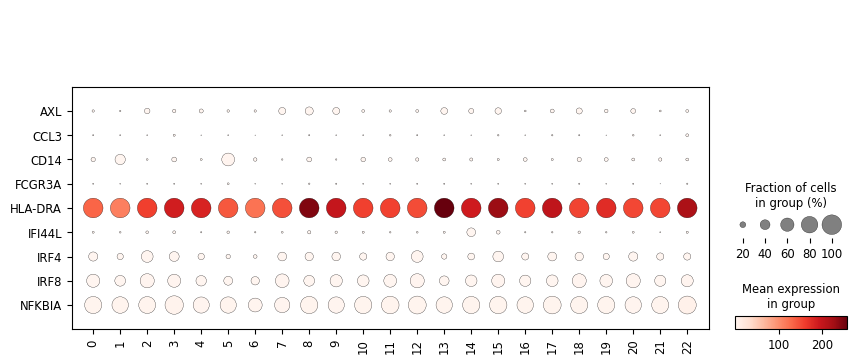

In [51]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

In [52]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     4493
1     4044
2     4003
3     3902
4     3873
5     3582
6     3383
7     3151
8     3107
9     2739
10    2709
11    2283
12    1972
13    1828
14    1598
15    1568
16    1481
17     818
18     801
19     799
20     560
21     319
22     275
Name: count, dtype: int64

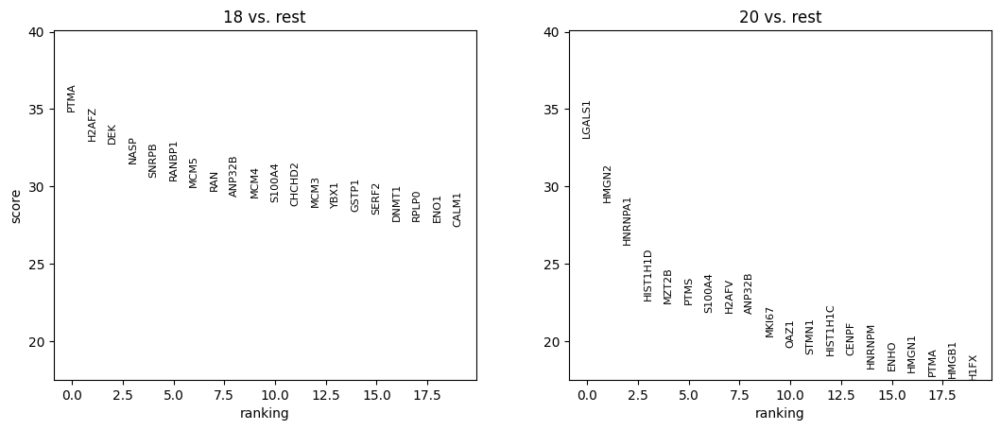

In [53]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['18','20']
)
sc.pl.rank_genes_groups(adata)

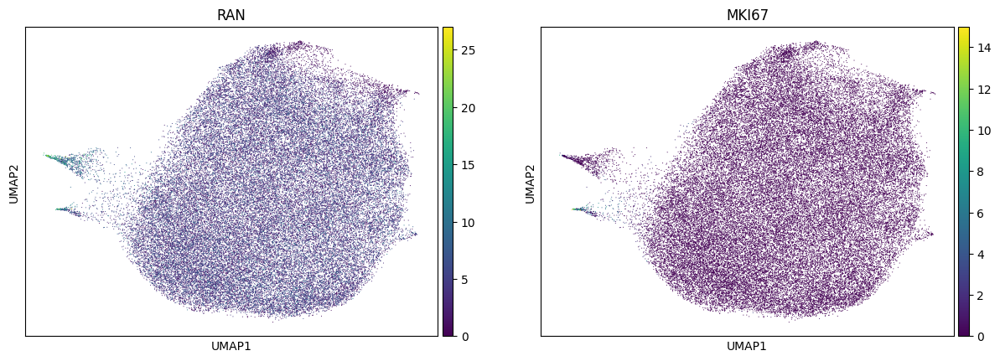

In [55]:
sc.pl.umap(adata, color = ['RAN','MKI67'], legend_loc = 'on data')

### Review ISG+ cDC2

In [58]:
cell_type = 'ISG+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [59]:
type_uuid

'57d60edc-e0a0-4d06-b7f6-931202a5d3c6'

In [60]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 57d60edc-e0a0-4d06-b7f6-931202a5d3c6
Files have been successfully downloaded!


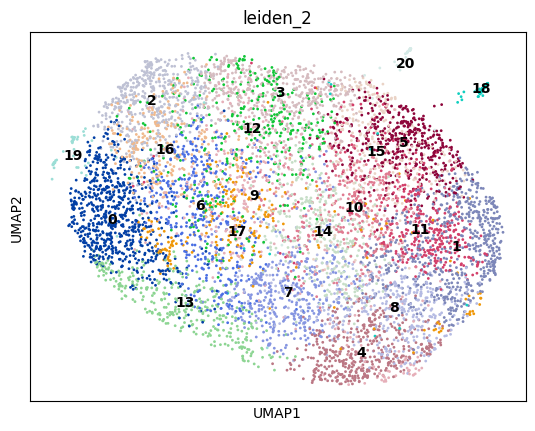

In [61]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

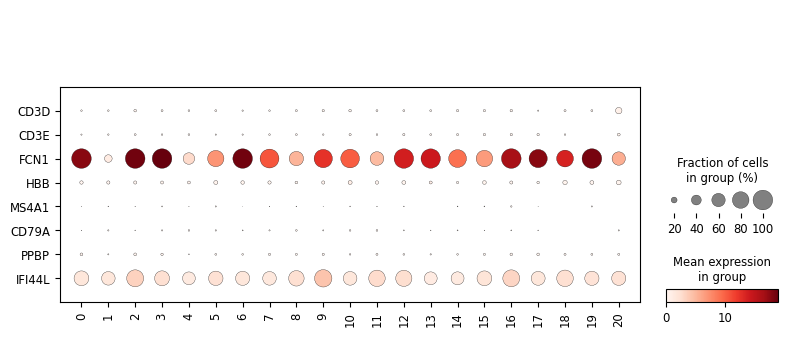

In [62]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

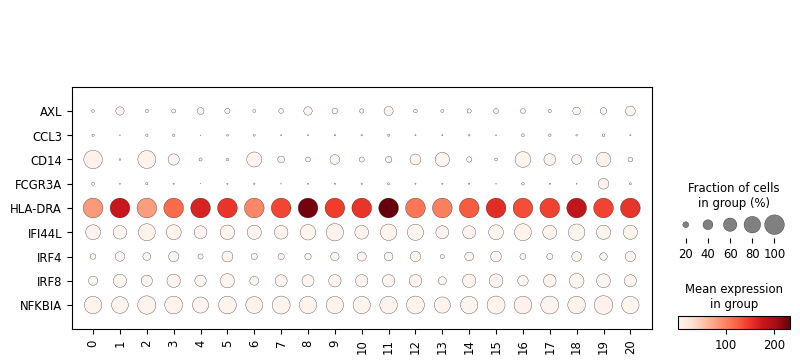

In [63]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

In [64]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     694
1     618
2     478
3     466
4     451
5     447
6     427
7     394
8     393
9     388
10    387
11    366
12    357
13    344
14    319
15    300
16    280
17    228
18     59
19     43
20     40
Name: count, dtype: int64

### Review pDC

In [65]:
cell_type = 'pDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [66]:
type_uuid

'e41f723e-e7ef-44c0-8f2d-150cca646c5a'

In [67]:
adata = read_adata_uuid(type_uuid)

downloading fileID: e41f723e-e7ef-44c0-8f2d-150cca646c5a
Files have been successfully downloaded!


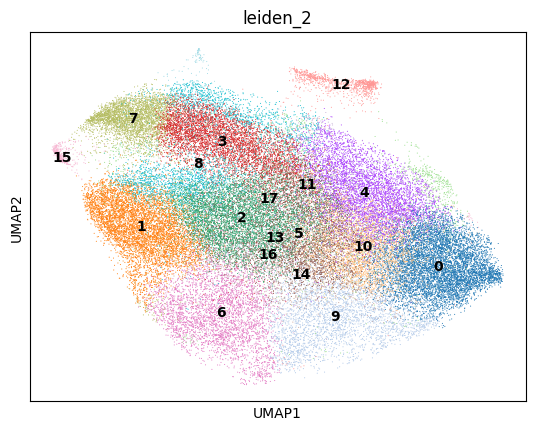

In [68]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

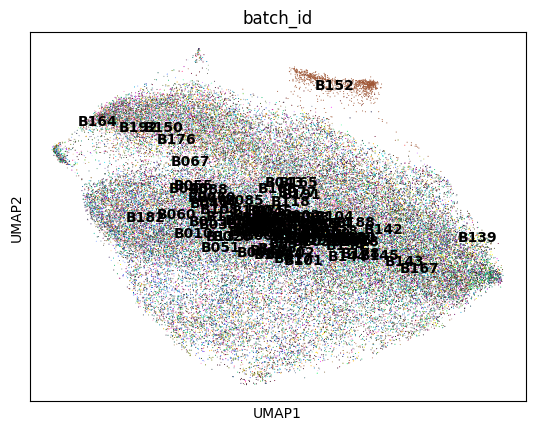

In [72]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

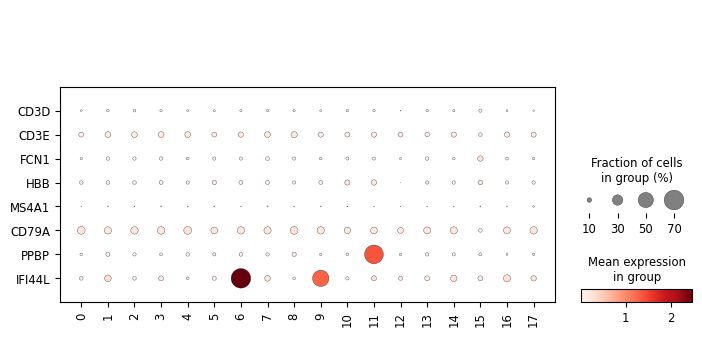

In [69]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

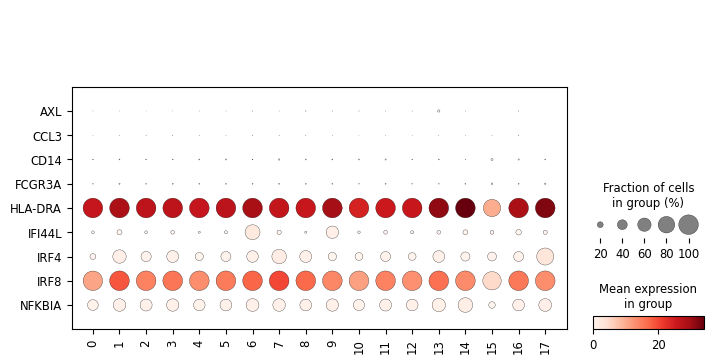

In [70]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

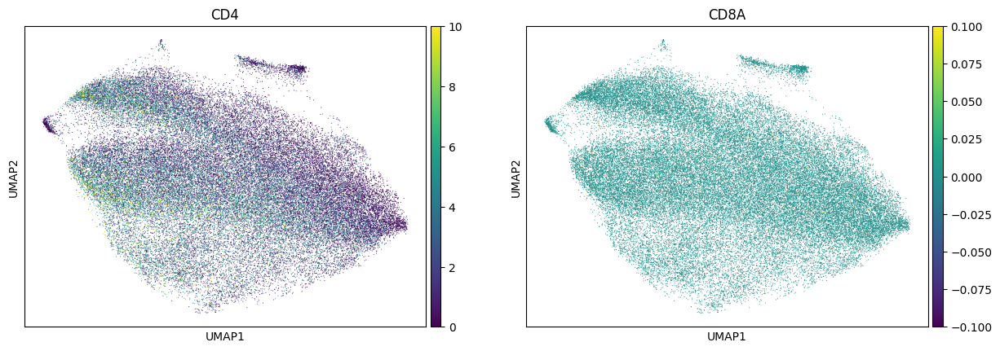

In [71]:
sc.pl.umap(adata, color = ['CD4','CD8A'], vmax = 'p99')

## Monocytes

### Review Core CD14 monocyte

In [73]:
cell_type = 'Core CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [74]:
type_uuid

'251daf13-9676-4306-ad24-efb98a7462eb'

In [75]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 251daf13-9676-4306-ad24-efb98a7462eb
Files have been successfully downloaded!


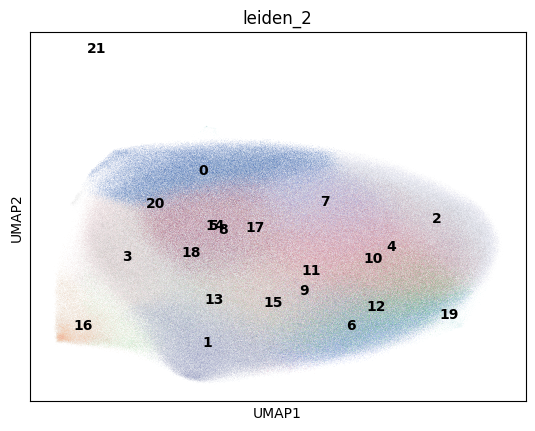

In [76]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

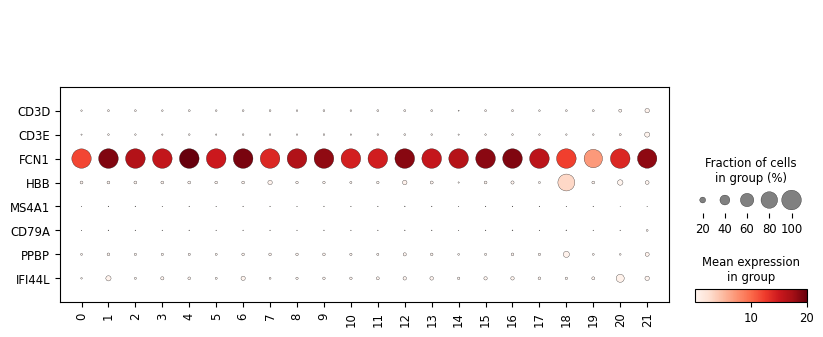

In [77]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

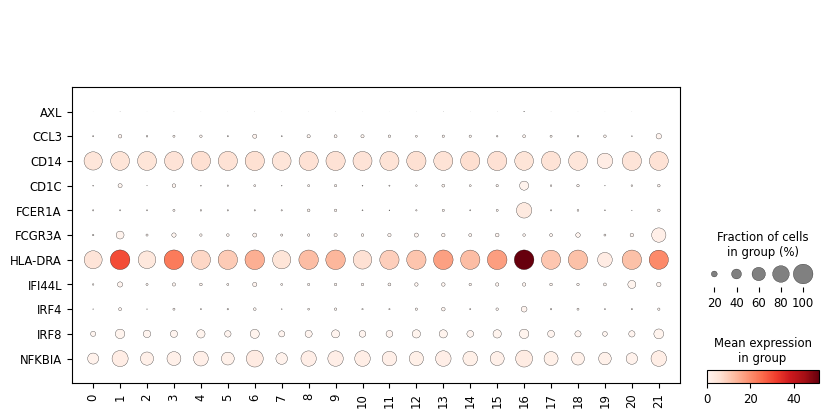

In [86]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

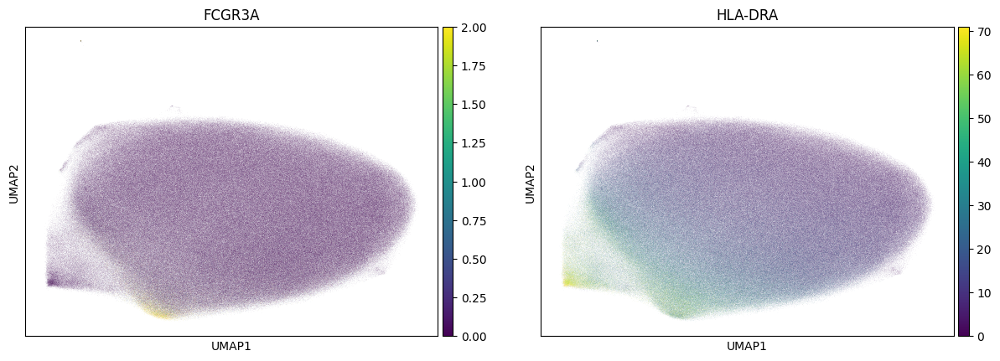

In [79]:
sc.pl.umap(adata, color = ['FCGR3A','HLA-DRA'], vmax = 'p99')

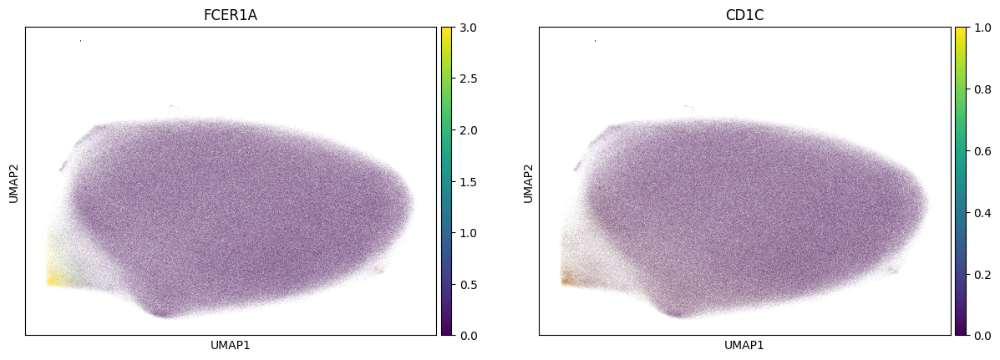

In [81]:
sc.pl.umap(adata, color = ['FCER1A','CD1C'], vmax = 'p99')

### Review ISG+ CD14 monocyte

In [87]:
cell_type = 'ISG+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [88]:
type_uuid

'1a077b56-8ce3-4782-8db9-e34cd340f835'

In [89]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 1a077b56-8ce3-4782-8db9-e34cd340f835
Files have been successfully downloaded!


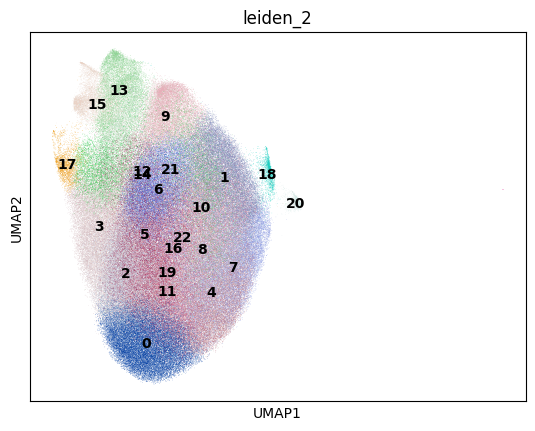

In [90]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

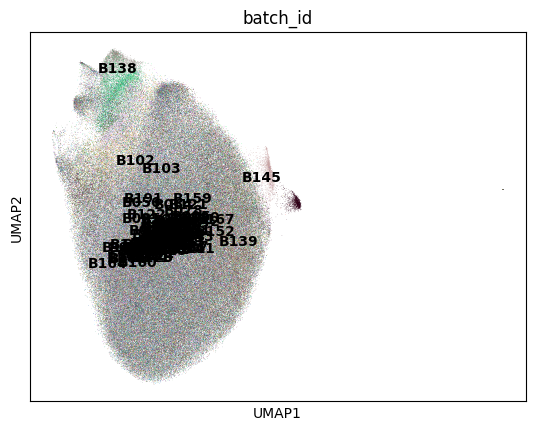

In [96]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

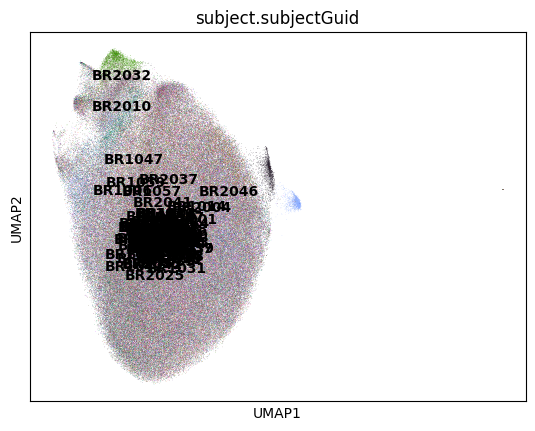

In [97]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

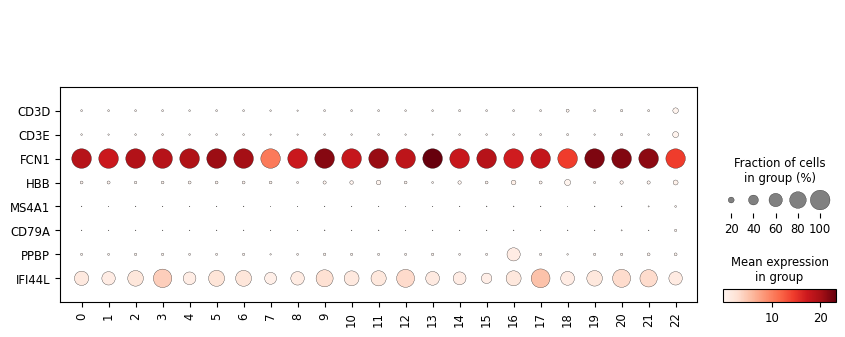

In [91]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

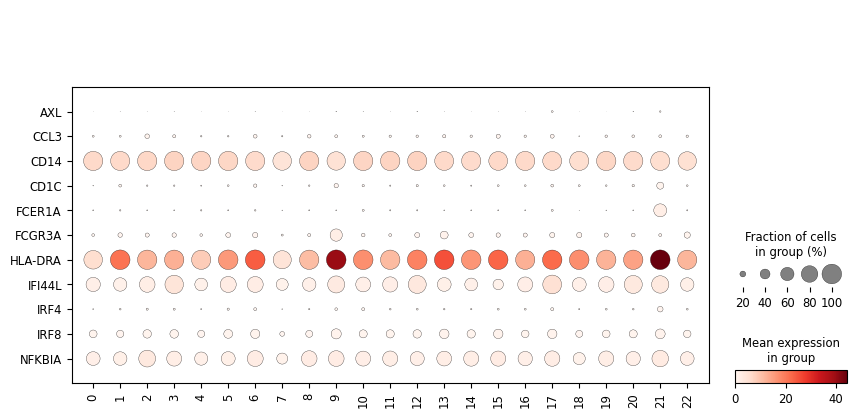

In [93]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

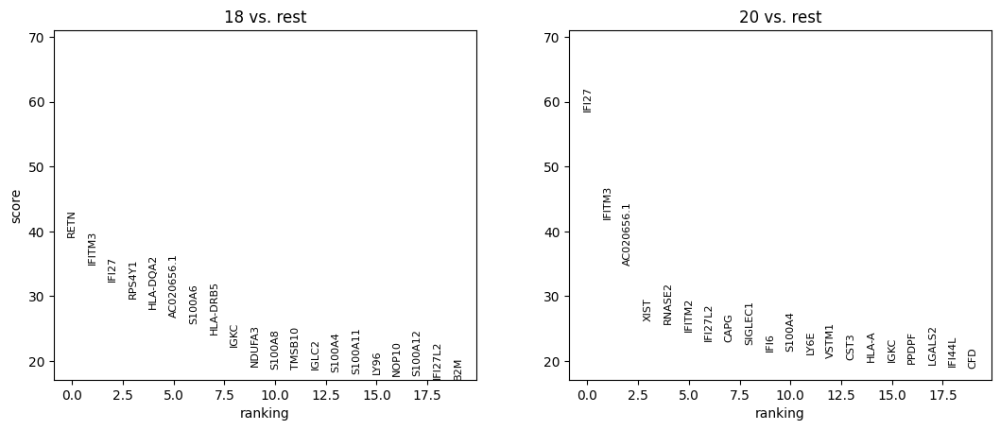

In [95]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['18','20']
)
sc.pl.rank_genes_groups(adata)

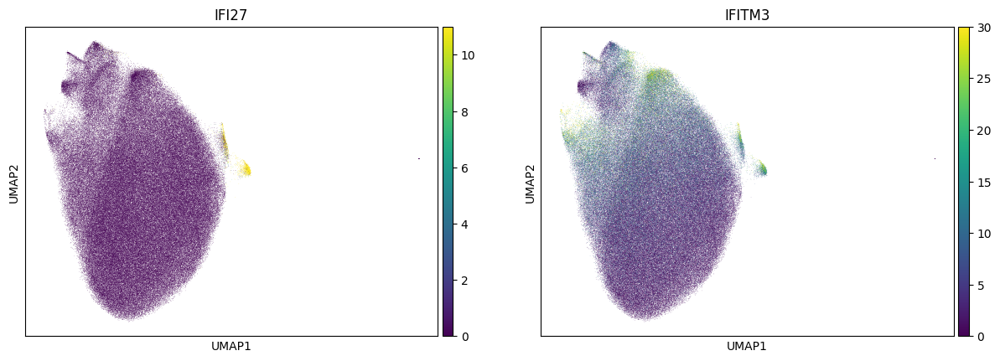

In [98]:
sc.pl.umap(adata, color = ['IFI27','IFITM3'], vmax = 'p99')

### Review IL1B+ CD14 monocyte

In [100]:
cell_type = 'IL1B+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [101]:
type_uuid

'151546da-6b2e-430b-9965-672dfbed3349'

In [102]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 151546da-6b2e-430b-9965-672dfbed3349
Files have been successfully downloaded!


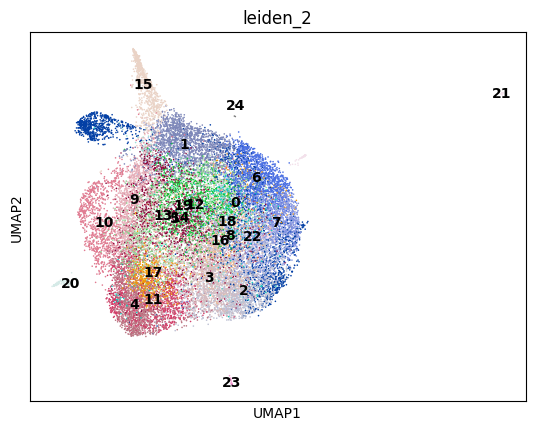

In [103]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

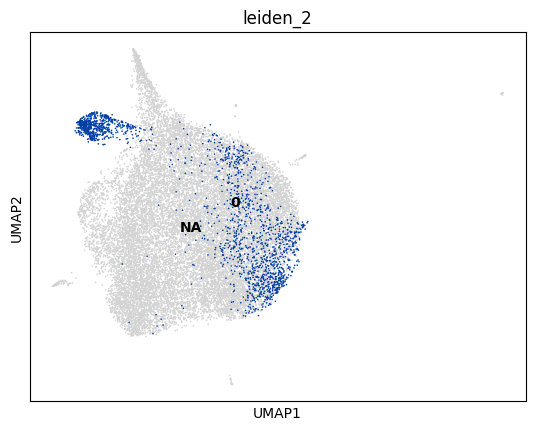

In [108]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = '0')

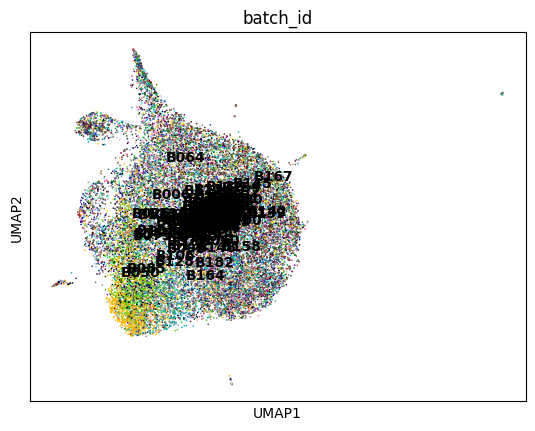

In [104]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

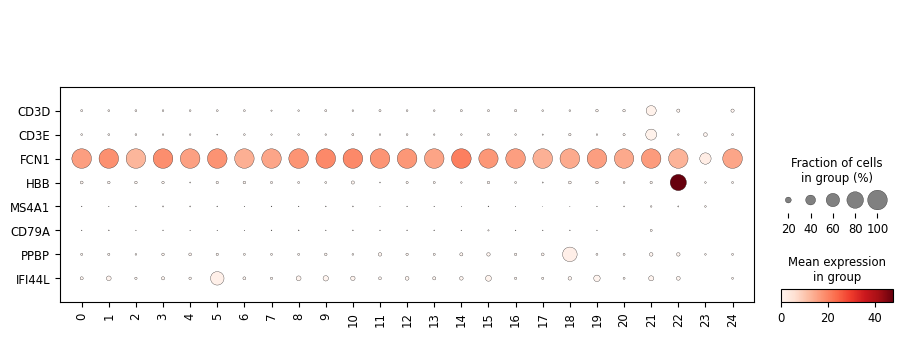

In [105]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

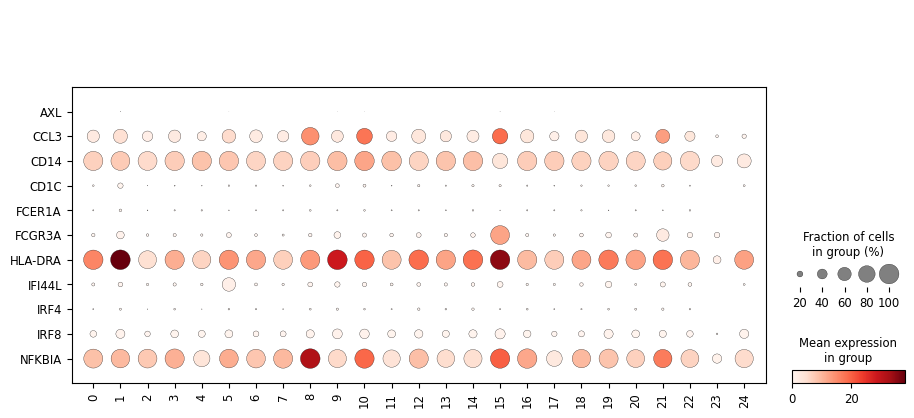

In [106]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

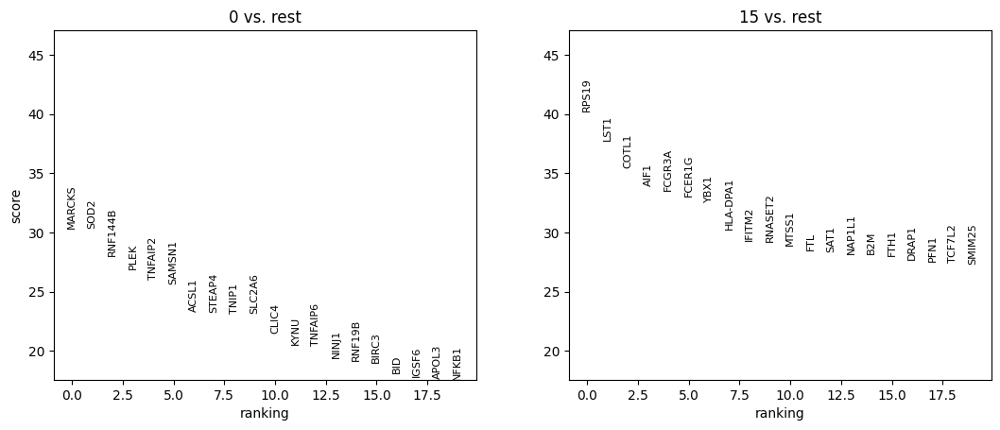

In [109]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['0','15']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

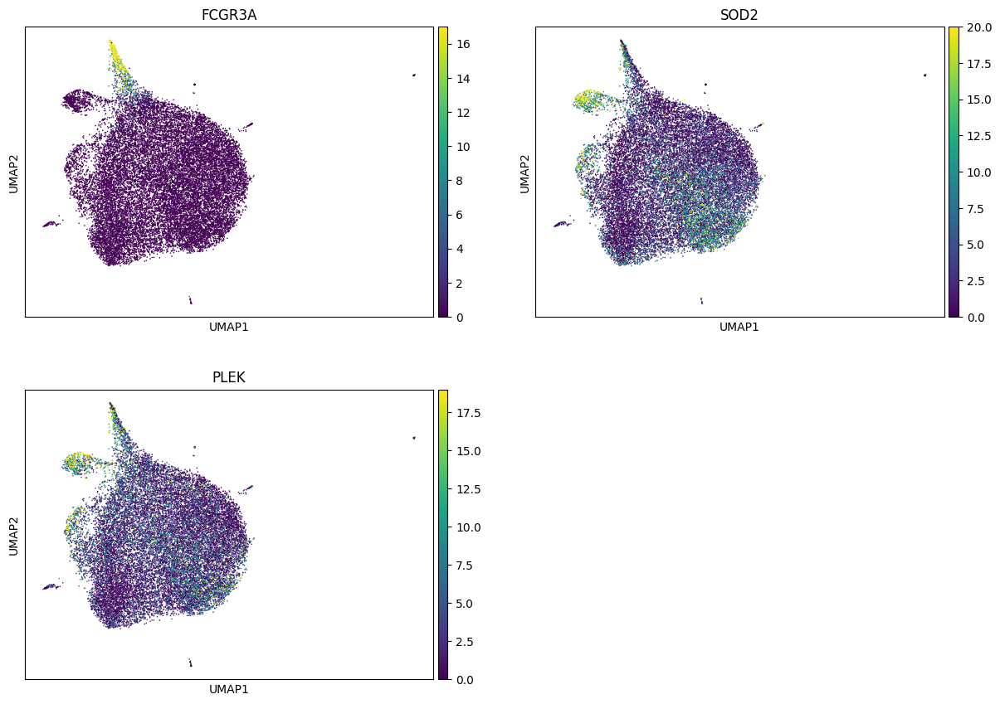

In [110]:
sc.pl.umap(adata, color = ['FCGR3A','SOD2','PLEK'], vmax = 'p99', ncols = 2)

### Review Intermediate monocyte

In [111]:
cell_type = 'Intermediate monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [112]:
type_uuid

'93576d16-3c28-47e4-8e3e-0533232d01d8'

In [113]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 93576d16-3c28-47e4-8e3e-0533232d01d8
Files have been successfully downloaded!


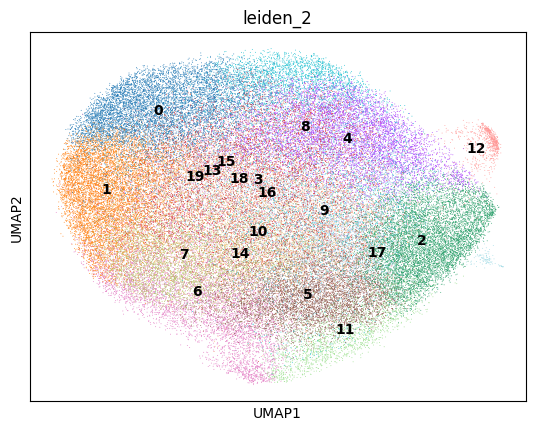

In [114]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

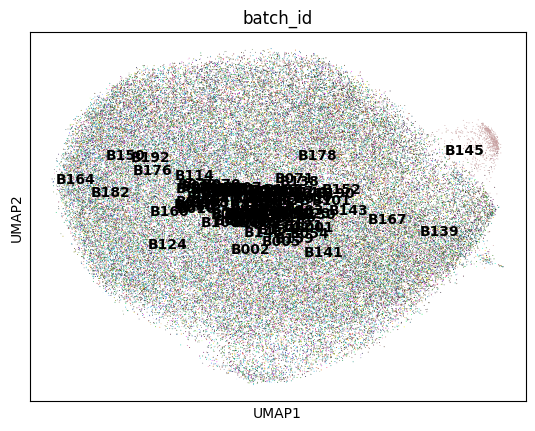

In [118]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

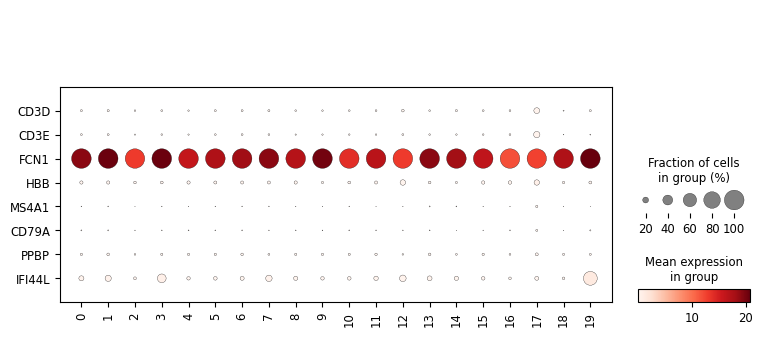

In [115]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

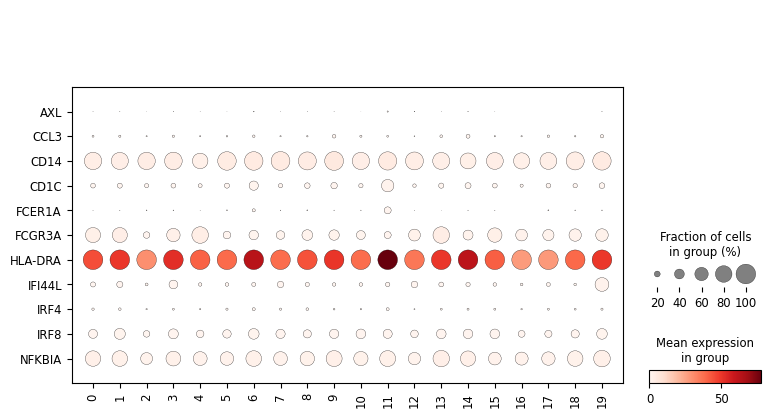

In [116]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

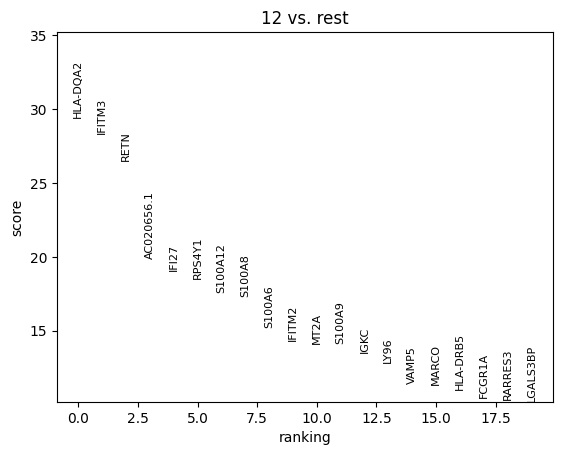

In [117]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['12']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

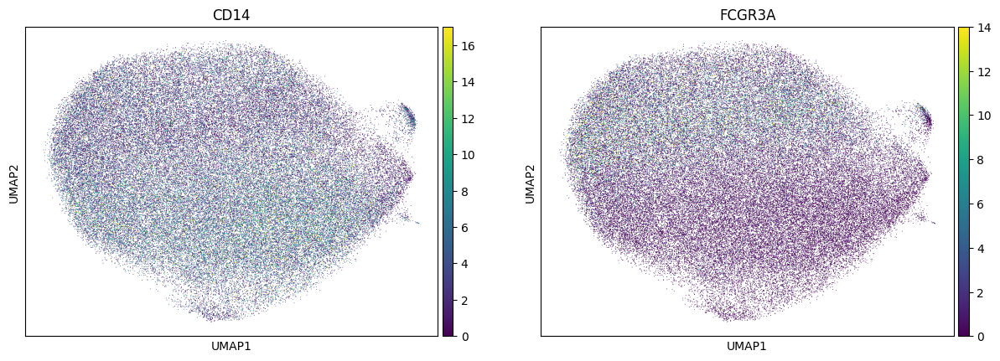

In [119]:
sc.pl.umap(adata, color = ['CD14','FCGR3A'], vmax = 'p99', ncols = 2)

### Review Core CD16 monocyte

In [120]:
cell_type = 'Core CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [121]:
type_uuid

'e70278dd-bf2c-4696-bdf5-a38281bc20fd'

In [122]:
adata = read_adata_uuid(type_uuid)

downloading fileID: e70278dd-bf2c-4696-bdf5-a38281bc20fd
Files have been successfully downloaded!


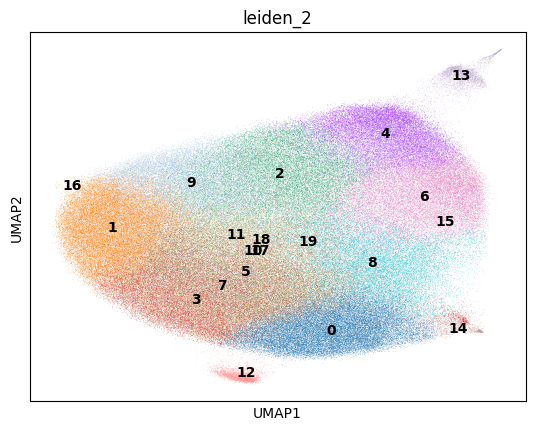

In [123]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

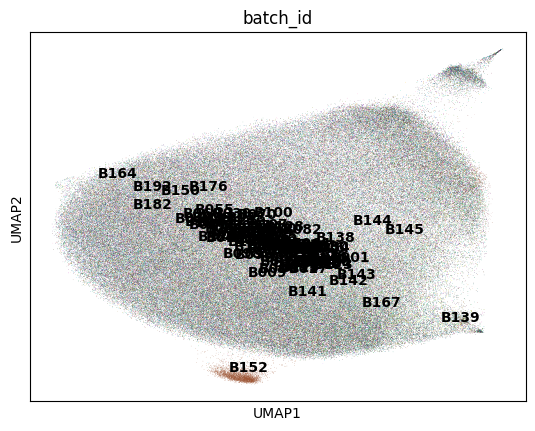

In [126]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

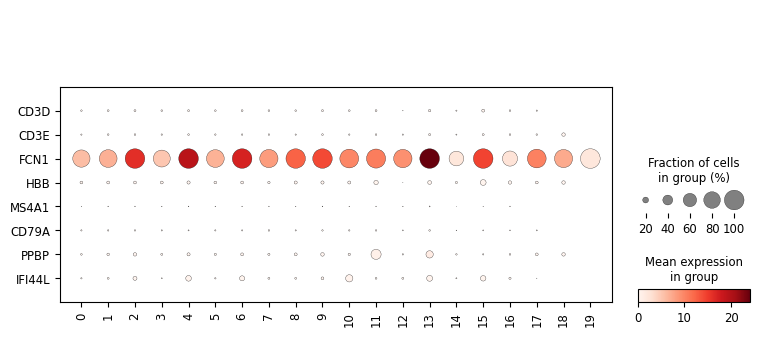

In [124]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

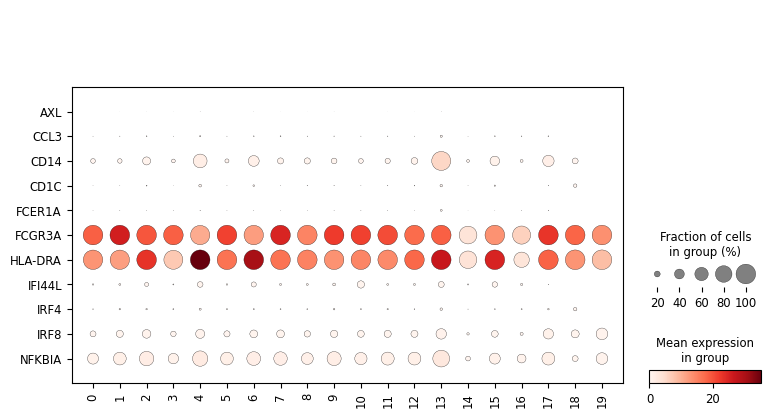

In [125]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

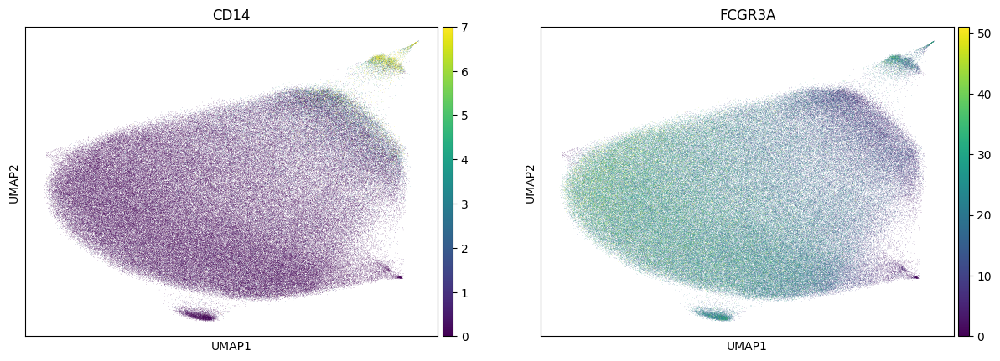

In [127]:
sc.pl.umap(adata, color = ['CD14','FCGR3A'], vmax = 'p99')

### Review C1Q+ CD16 monocyte

In [128]:
cell_type = 'C1Q+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [129]:
type_uuid

'5474cd1d-4c53-457b-b25f-a28e90794604'

In [130]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 5474cd1d-4c53-457b-b25f-a28e90794604
Files have been successfully downloaded!


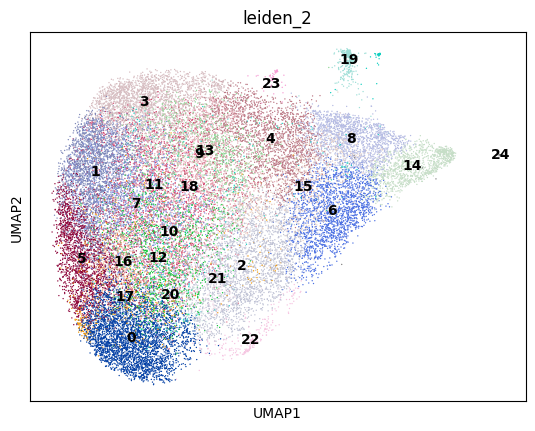

In [131]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

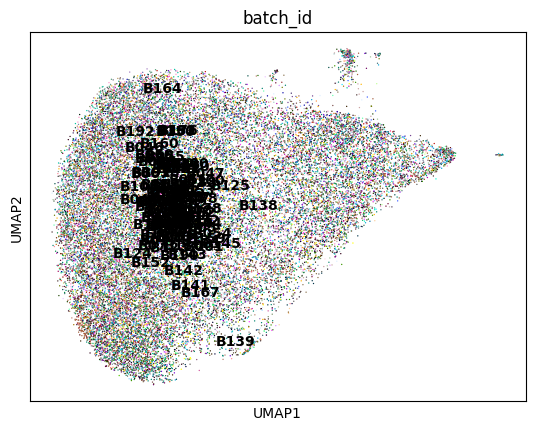

In [134]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

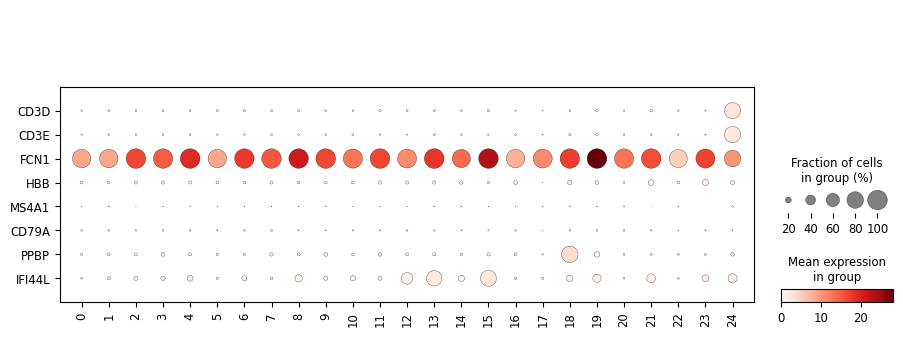

In [132]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

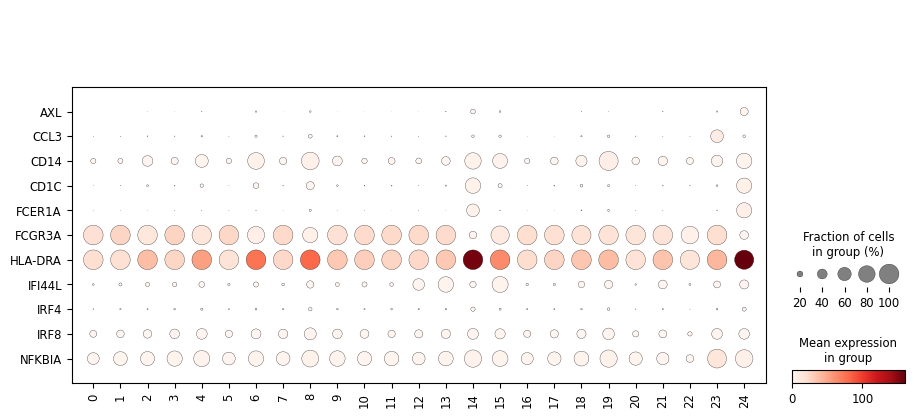

In [133]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

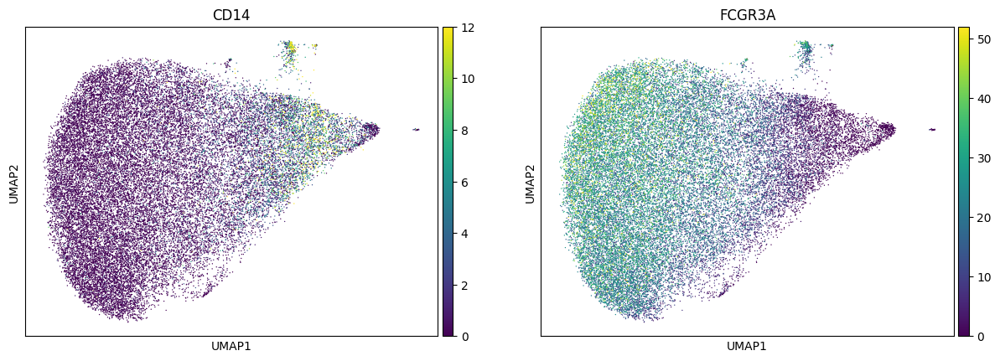

In [135]:
sc.pl.umap(adata, color = ['CD14','FCGR3A'], vmax = 'p99')

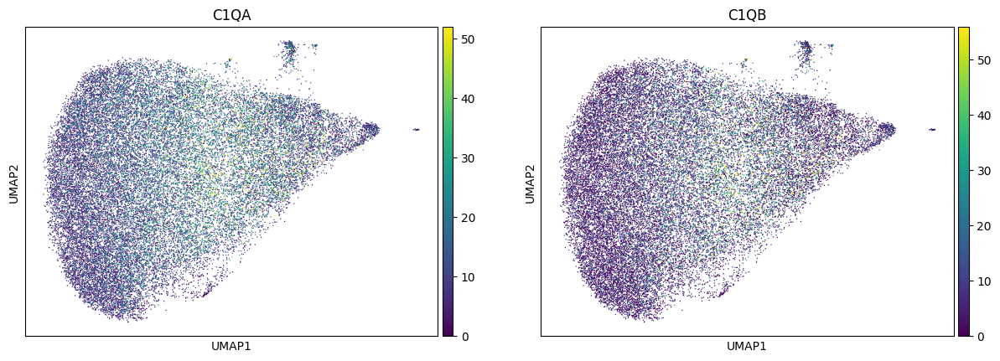

In [136]:
sc.pl.umap(adata, color = ['C1QA','C1QB'], vmax = 'p99')

### Review ISG+ CD16 monocyte

In [137]:
cell_type = 'ISG+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [138]:
type_uuid

'e4ecfc35-bc66-4fe8-80b3-93fe6205ce1b'

In [139]:
adata = read_adata_uuid(type_uuid)

downloading fileID: e4ecfc35-bc66-4fe8-80b3-93fe6205ce1b
Files have been successfully downloaded!


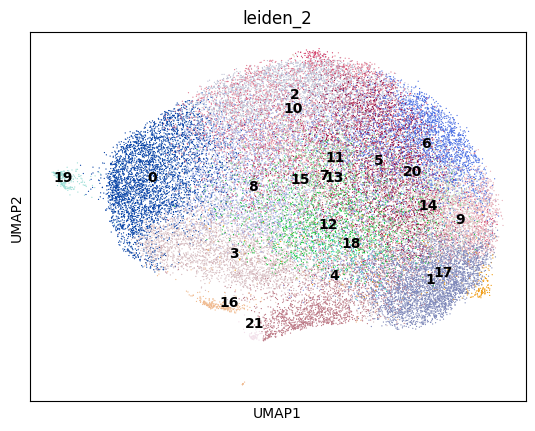

In [140]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

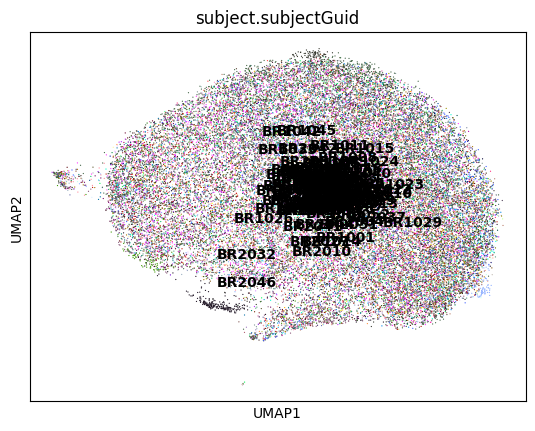

In [141]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

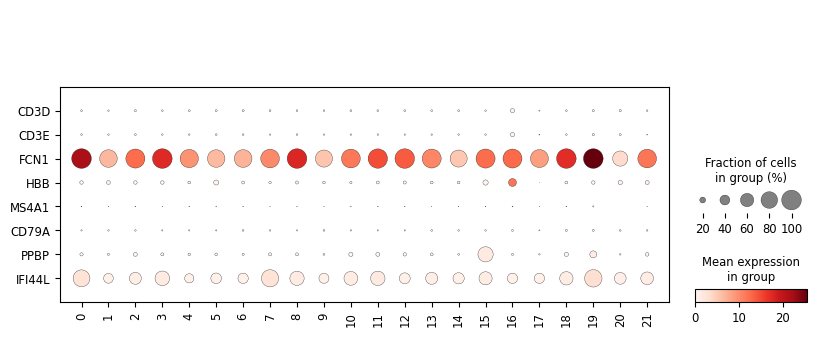

In [142]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

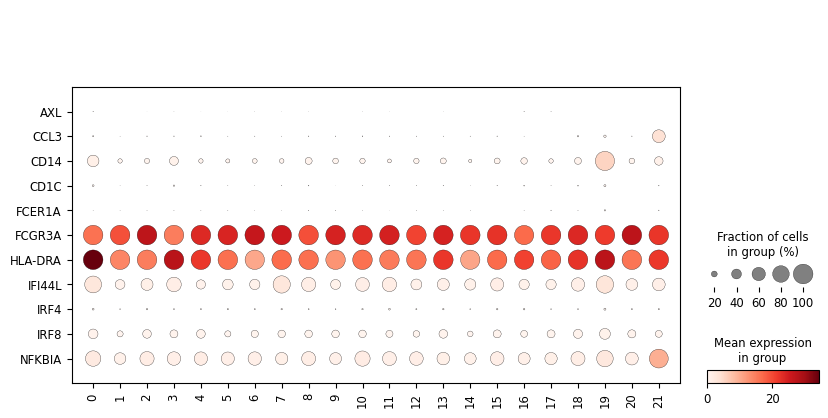

In [143]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

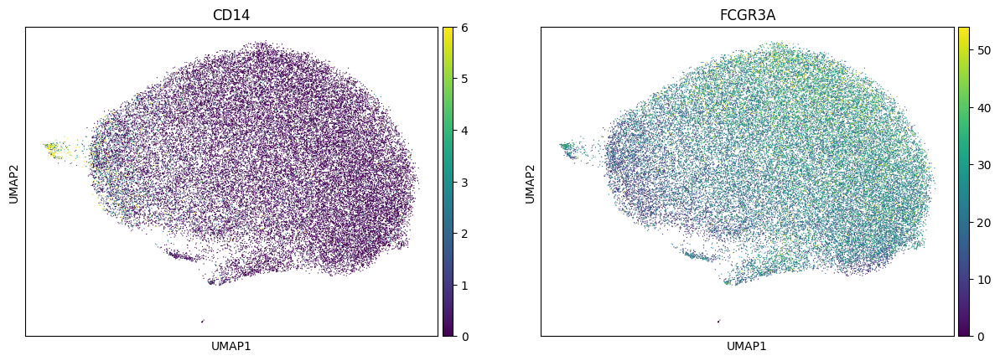

In [144]:
sc.pl.umap(adata, color = ['CD14','FCGR3A'], vmax = 'p99')